In [ ]:
# Path de las imágenes:
path = '/content/drive/MyDrive/Analisis_y_Tratamiento_de_Imagenes_Satelitales/TP2/'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
pip install minisom

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from minisom import MiniSom
from PIL import Image
import plotly.graph_objects as go
from scipy.spatial.distance import cdist

In [ ]:
from google.colab.patches import cv2_imshow # Esto es solo para que google colab nos deje graficar usando openCV
#cv2_imshow()

# 1. Implementar el filtro bilateral. Aplicarlo a una imagen en color.

In [ ]:
def bilateral_filter(image, d, sigma_r, sigma_d):
    # Aplicamos el filtro bilateral a cada canal separadamente
    # Reduce el ruido pero preservando bordes
    filtered_image = np.zeros_like(image)
    for i in range(image.shape[2]):
        filtered_image[:, :, i] = cv2.bilateralFilter(image[:, :, i], d, sigma_r, sigma_d)
    
    return filtered_image


Imagen filtrada



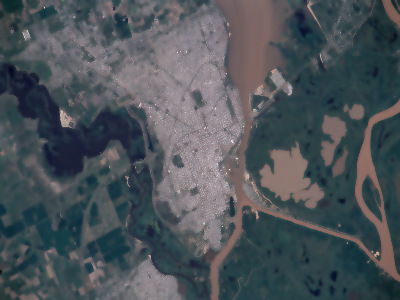


Imagen original



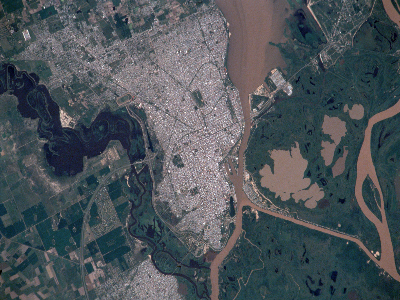

In [ ]:
# Cargamos la imagen con OpenCV
image = cv2.imread(path+'Vista_satelital_santa_fe.jpg')

# Aplicamos el filtro bilateral
d = 39 # Tamaño del vecindario utilizado en el filtrado bilateral
sigma_r = 40 # Range standard deviation: Este parámetro controla la desviación estándar utilizada en el cálculo de la similitud de los valores de color.
sigma_d = 50 # Spatial standard deviation: Este parámetro controla la desviación estándar utilizada en el cálculo de la proximidad espacial entre píxeles vecinos.
filtered_image = bilateral_filter(image, d, sigma_r, sigma_d)

# Redimensionamos las imagenes porque son muy grandes
new_size = (400, 300)
image = cv2.resize(image, new_size)
filtered_image = cv2.resize(filtered_image, new_size)

# Vemos el resultado
print("\nImagen filtrada\n")
cv2_imshow(filtered_image)
print("\nImagen original\n")
cv2_imshow(image)


Imagen filtrada



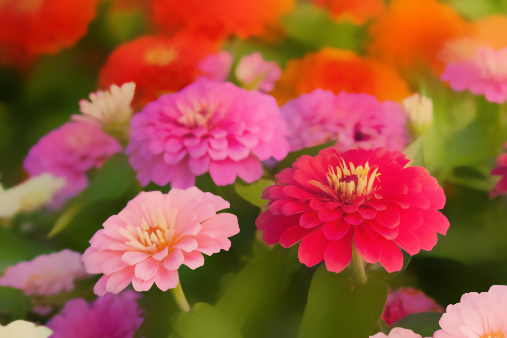


Imagen original



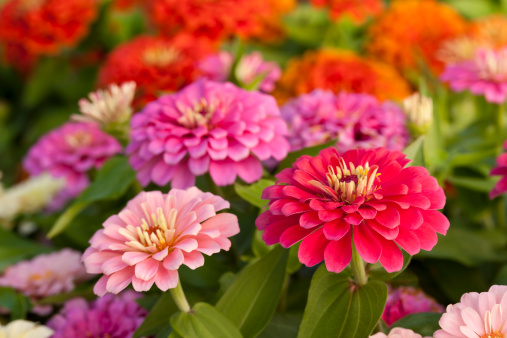

In [ ]:
# Veamos como queda en otra imagen

image = cv2.imread(path+'flores.jpg')
d = 39
sigma_r = 40
sigma_d = 50
filtered_image = bilateral_filter(image, d, sigma_r, sigma_d)

print("\nImagen filtrada\n")
cv2_imshow(filtered_image)
print("\nImagen original\n")
cv2_imshow(image)

# Aca se nota un poco mejor como el filtro preserva los bordes, sobre todo en las flores de adelante.

# 2. Implementar los siguientes algoritmos de umbralización y aplicarlos a una imagen satelital banda por banda y en color:

## 2a. Umbralización Global

In [ ]:
def global_threshold(image):
    
    # Chequeamos que el input sea una imagen en blanco y negro
    assert len(image.shape) == 2, "El input tiene que ser una imagen de una sola banda!"

    # Establecemos el umbral inicial
    threshold_value = 120
    prev_threshold = 0

    while threshold_value - prev_threshold > 5: # El loop sigue mientras la diferencia entre un threshold y el siguiente sea mayor a 5
        # Binarizamos la imagen usando el umbral actual
        _, thresholded_image = cv2.threshold(image, threshold_value, 255, cv2.THRESH_BINARY)

        # Calculamos la cantidad de píxeles en cada grupo
        foreground_pixels = np.count_nonzero(thresholded_image == 255)
        background_pixels = np.count_nonzero(thresholded_image == 0)

        # Calculamos el nuevo umbral
        new_threshold = ((np.sum(image[thresholded_image == 255])/foreground_pixels) +
                         (np.sum(image[thresholded_image == 0])/background_pixels))/2

        # Actualizamos el umbral anterior y el umbral actual
        prev_threshold = threshold_value
        threshold_value = int(new_threshold)

    # Binarizamos la imagen usando el umbral final
    _, thresholded_image = cv2.threshold(image, threshold_value, 255, cv2.THRESH_BINARY)

    return threshold_value, thresholded_image


Umbral: 137



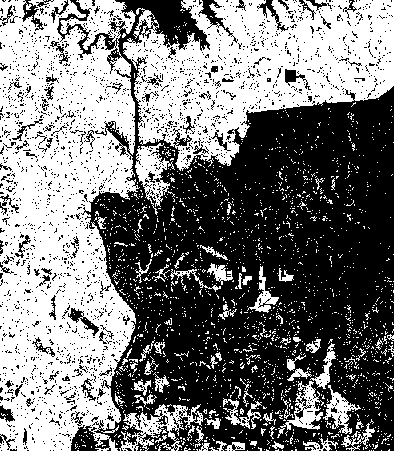

In [ ]:
# Cargamos la imagen
image = cv2.imread(path+'LC08_224-078_2018-01-05_RGB.tif')[:,324:718] # Le sacamos los bordes negros que tiene la imagen

# Convertimos la imagen a escala de grises
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Aplicamos umbralización global
threshold_value, thresholded_image = global_threshold(gray_image)

print(f'\nUmbral: {threshold_value}\n')

# Mostramos la imagen umbralizada
cv2_imshow(thresholded_image)


Banda 0

Umbral: 109



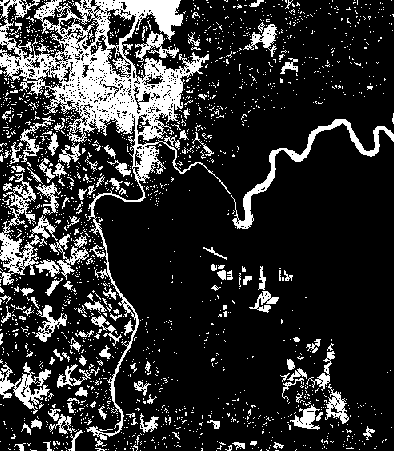


Banda 1

Umbral: 123



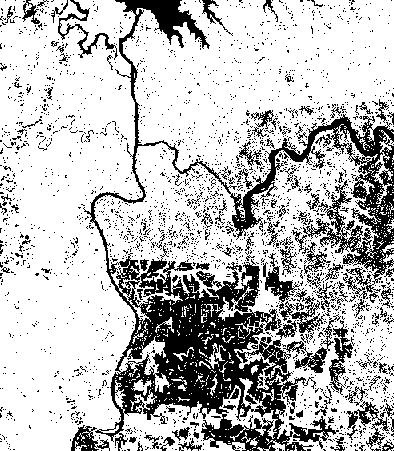


Banda 2

Umbral: 121



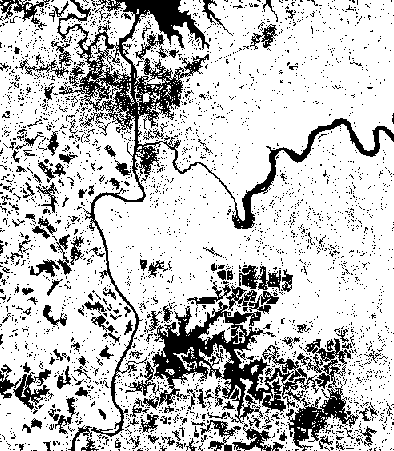

In [ ]:
# Ahora repetimos pero umbralizando banda por banda

image = cv2.imread(path+'LC08_224-078_2018-01-05_RGB.tif')[:,324:718] # Le sacamos los bordes negros que tiene la imagen

for i in range(image.shape[2]):
  threshold_value, thresholded_image = global_threshold(image[:,:,i])
  print(f'\nBanda {i}')
  print(f'\nUmbral: {threshold_value}\n')
  cv2_imshow(thresholded_image)


## 2b. Método de umbralización de Otsu

In [ ]:
def otsu_threshold(image):
    # Convertimos la imagen a escala de grises
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Aplicamos umbralización de Otsu
    umbral, thresholded_image = cv2.threshold(gray_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    return umbral, thresholded_image


Umbral: 143.0



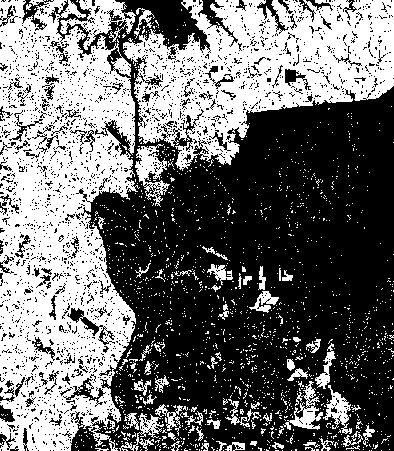

In [ ]:
# Cargamos la imagen
image = cv2.imread(path+'LC08_224-078_2018-01-05_RGB.tif')[:,324:718]

# Aplicamos umbralización de Otsu
umbral, thresholded_image = otsu_threshold(image)

print(f'\nUmbral: {umbral}\n')

# Mostramos la imagen umbralizada
cv2_imshow(thresholded_image)

## 2c. Método de umbralización multinivel de Otsu aplicado a imágenes en color (RGB)

In [ ]:
def multilevel_otsu_rgb(image):
    # Separamos los canales de color RGB
    r, g, b = cv2.split(image)

    # Aplicamos umbralización de Otsu a cada canal por separado
    umbral_r, thresholded_r = cv2.threshold(r, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    umbral_g, thresholded_g = cv2.threshold(g, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    umbral_b, thresholded_b = cv2.threshold(b, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Combinamos los resultados de umbralización
    thresholded_image = cv2.merge((thresholded_r, thresholded_g, thresholded_b))

    return umbral_r, umbral_g, umbral_b, thresholded_image


Imagen original



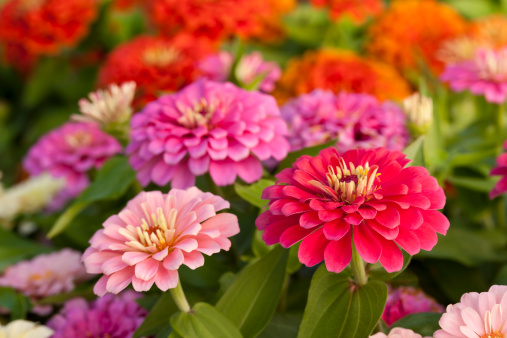


Umbral rojo: 80.0
Umbral verde: 94.0
Umbral azul: 147.0



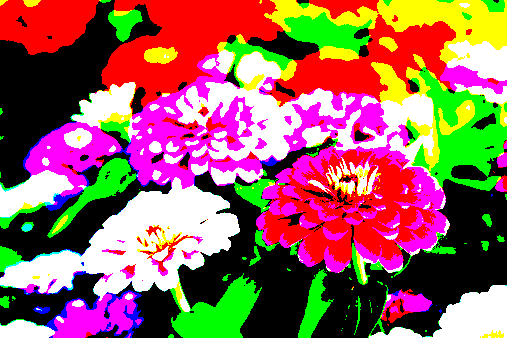

In [ ]:
# Cargamos la imagen
image = cv2.imread(path+'flores.jpg')

# Aplicamos umbralización multinivel de Otsu a la imagen en color
umbral_r, umbral_g, umbral_b, thresholded_image = multilevel_otsu_rgb(image)

print('\nImagen original\n')
cv2_imshow(image)

print(f'\nUmbral rojo: {umbral_r}')
print(f'Umbral verde: {umbral_g}')
print(f'Umbral azul: {umbral_b}\n')

# Mostramos la imagen umbralizada
cv2_imshow(thresholded_image)

## 2d. Método de umbralización multinivel utilizando una imagen Landsat


Umbral rojo: 103.0
Umbral verde: 154.0
Umbral azul: 172.0



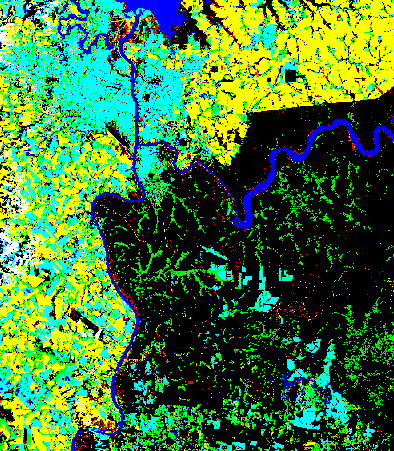

In [ ]:
# Repetimos lo del punto anterior pero con una imagen Landsat

image = cv2.imread(path+'LC08_224-078_2018-01-05_RGB.tif')[:,324:718]
umbral_r, umbral_g, umbral_b, thresholded_image = multilevel_otsu_rgb(image)

print(f'\nUmbral rojo: {umbral_r}')
print(f'Umbral verde: {umbral_g}')
print(f'Umbral azul: {umbral_b}\n')
cv2_imshow(thresholded_image)

# 3. Implementar el detector de borde de Canny. Aplicarlo a imágenes satelitales banda por banda y observar los resultados.

In [ ]:
def canny_edge_detection(image, min_threshold, max_threshold):
    # Aplicar el detector de bordes de Canny
    edges = cv2.Canny(image, min_threshold, max_threshold)

    # Si el gradiente de un pixel es mayor que el max_threshold, entonces se acepta al pixel como borde
    # Si el gradiente de un pixel es menor que el min_threshold, entonces se lo rechaza como borde
    # Si el gradiente está entre ambos thresholds, entonces se lo acepta como borde solo si está conectado a un pixel que está sobre el max_threshold

    return edges


Bordes primera banda



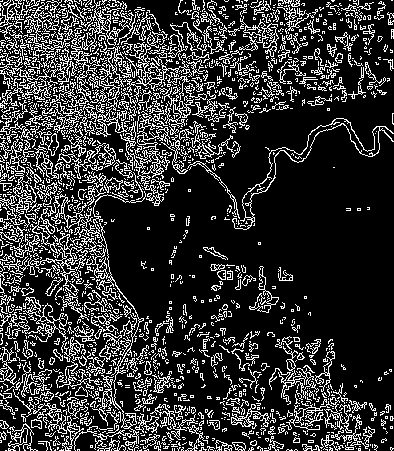


Bordes segunda banda



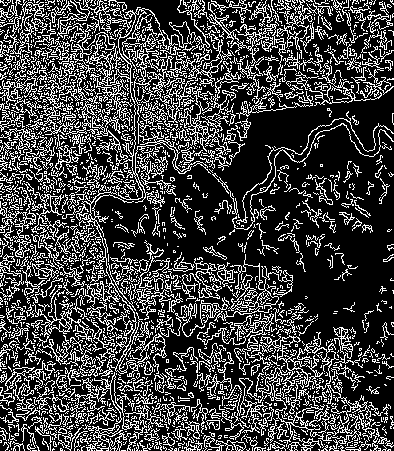


Bordes tercera banda



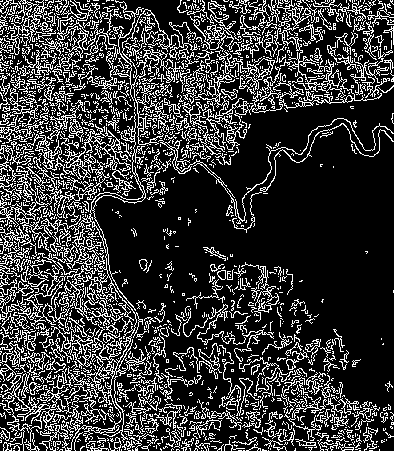

In [ ]:
# Cargar la imagen satelital
image = cv2.imread(path+'LC08_224-078_2018-01-05_RGB.tif')[:,324:718]

# Aplicar el detector de bordes de Canny a cada banda por separado
edges_b = canny_edge_detection(image[:, :, 0], 100, 200)  # Banda azul
edges_g = canny_edge_detection(image[:, :, 1], 100, 200)  # Banda verde
edges_r = canny_edge_detection(image[:, :, 2], 100, 200)  # Banda roja

# Mostrar los resultados
print("\nBordes primera banda\n")
cv2_imshow(edges_b)
print("\nBordes segunda banda\n")
cv2_imshow(edges_g)
print("\nBordes tercera banda\n")
cv2_imshow(edges_r)


Bordes primera banda



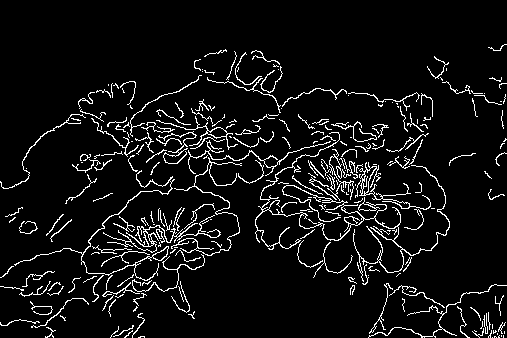


Bordes segunda banda



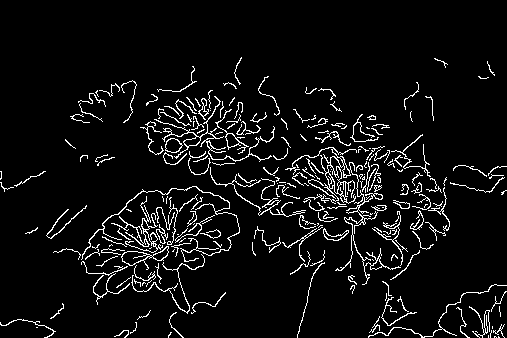


Bordes tercera banda



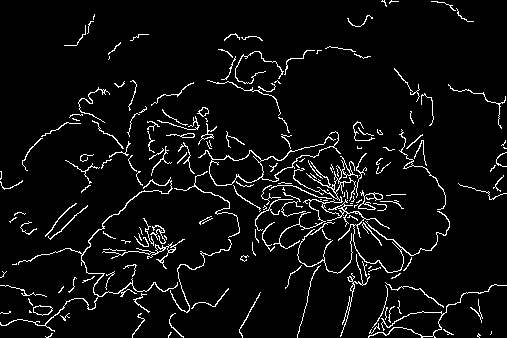

In [ ]:
# Solo para ver más claramente la diferencia entre bandas, aplicamos canny a una imagen no satelital

image = cv2.imread(path+'flores.jpg')
edges_b = canny_edge_detection(image[:, :, 0], 100, 200)
edges_g = canny_edge_detection(image[:, :, 1], 100, 200)
edges_r = canny_edge_detection(image[:, :, 2], 100, 200)
print("\nBordes primera banda\n")
cv2_imshow(edges_b)
print("\nBordes segunda banda\n")
cv2_imshow(edges_g)
print("\nBordes tercera banda\n")
cv2_imshow(edges_r)

# 4. Implementar el Método del Smallest Univaluate Assimilating Nucleus (SUSAN) para (aplicarlo a una imagen satelital banda por banda):

## 4a. Detección de bordes

In [ ]:
def susan_detection(image, threshold, upper_limit, lower_limit):

    # Chequeamos que el input sea una imagen en blanco y negro
    assert len(image.shape) == 2, "El input tiene que ser una imagen de una sola banda!"

    # Aplicamos filtro de suavizado
    smoothed = cv2.GaussianBlur(image, (3, 3), 0)
    smoothed = smoothed.astype(np.float64)

    # Inicializamos matriz de bordes
    edges = np.zeros_like(image)

    # Definimos umbral de diferencia
    diff_threshold = threshold

    # Obtenemos dimensiones de la imagen
    height, width = image.shape

    # Iteramos sobre cada píxel
    for y in range(3, height - 3):
        for x in range(3, width - 3):

            # Obtenemos vecindario circular de 7x7
            neighborhood = smoothed[y - 3:y + 4, x - 3:x + 4]

            diff = np.abs(neighborhood - neighborhood[3,3]) # Calcuamos la diferencia de cada pixel con el pixel central
            count = np.sum(diff < diff_threshold) # Cantidad de posiciones donde el array es menor que diff_threshold
            total = diff.size # Cantidad total de píxeles del vecindario
            result = 1 - (count / total) # Esto es lo que llamamos s(r0) en SUSAN

            # Si result está cerca de 0.5, se considera borde (si estuviese cera de 0.75 se consideraría esquina)
            if result < upper_limit and result > lower_limit: # upper y lower limit fijan que tanto permito que result se aleje de 0.5
                edges[y, x] = 255

    return edges


Imagen Original (en blanco y negro)



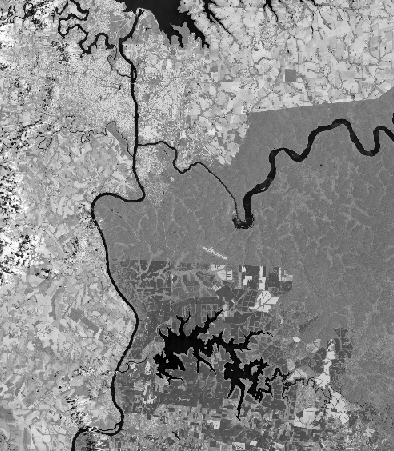


Imagen de Bordes



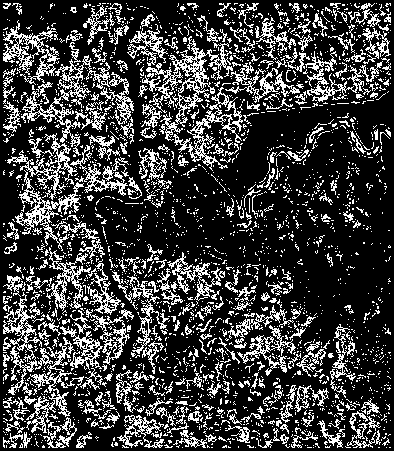

In [ ]:
# Cargamos la imagen
image = cv2.imread(path+"LC08_224-078_2018-01-05_RGB.tif")[:,324:718]

# Convertimos la imagen a escala de grises
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Aplicamos SUSAN
edges = susan_detection(gray, threshold=10, upper_limit=0.6, lower_limit=0.4)

# Mostramos la imagen original y la imagen con los bordes resaltados
print('\nImagen Original (en blanco y negro)\n')
cv2_imshow(gray)
print('\nImagen de Bordes\n')
cv2_imshow(edges)


Primera Banda



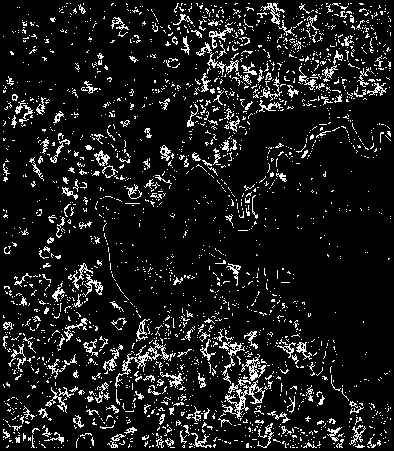


Segunda Banda



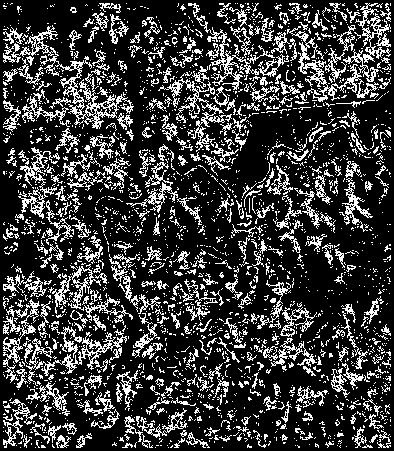


Tercera Banda



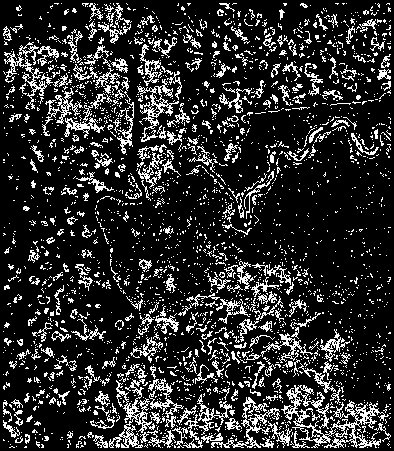

In [ ]:
# Ahora aplicamos la detección de bordes pero banda por banda

# Cargamos la imagen satelital
image = cv2.imread(path+'LC08_224-078_2018-01-05_RGB.tif')[:,324:718]

# Aplicamos el detector de bordes SUSAN a cada banda por separado
edges_b = susan_detection(image[:, :, 0], threshold=10, upper_limit=0.6, lower_limit=0.4)  # Banda azul
edges_g = susan_detection(image[:, :, 1], threshold=10, upper_limit=0.6, lower_limit=0.4)  # Banda verde
edges_r = susan_detection(image[:, :, 2], threshold=10, upper_limit=0.6, lower_limit=0.4)  # Banda roja

# Mostramos los resultados
print('\nPrimera Banda\n')
cv2_imshow(edges_b)
print('\nSegunda Banda\n')
cv2_imshow(edges_g)
print('\nTercera Banda\n')
cv2_imshow(edges_r)


Imagen Original (en blanco y negro)



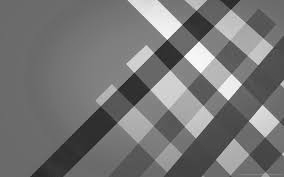


Imagen de Bordes



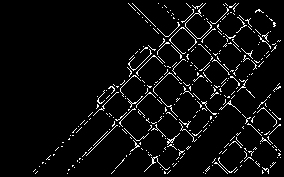

In [ ]:
# Ahora aplicamos la detección de bordes pero en otra imagen en donde se vea más claramente

image = cv2.imread(path+'rayas.jfif')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
edges = susan_borde_detection(gray, threshold=10, upper_limit=0.6, lower_limit=0.4)
print('\nImagen Original (en blanco y negro)\n')
cv2_imshow(gray)
print('\nImagen de Bordes\n')
cv2_imshow(edges)


## 4b. Detección de esquinas


Imagen Original (en blanco y negro)



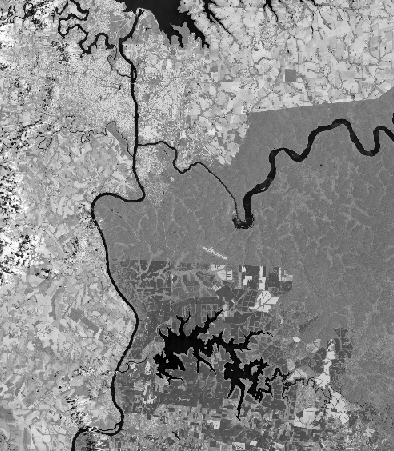


Imagen de Esquinas



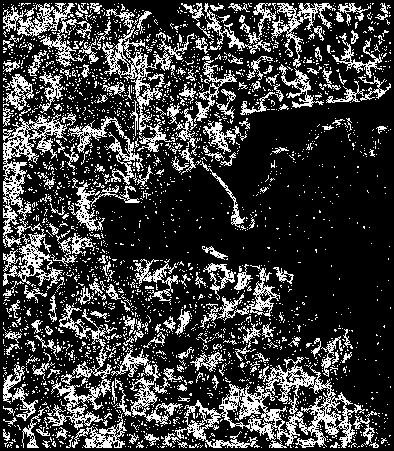

In [ ]:
# La detección de esquina con SUSAN es igual a la de bordes, solo que con upper y lower limit pedimos estar cerca de 0.75 en vez de 0.5

# Cargamos la imagen satelital
image = cv2.imread(path+'LC08_224-078_2018-01-05_RGB.tif')[:,324:718]

# Convertimos la imagen a escala de grises
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Aplicamos SUSAN
corners = susan_detection(gray, threshold=10, upper_limit=0.85, lower_limit=0.65) # Elijo los límites para que esto sirva para detectar esquinas

# Mostramos la imagen original y la imagen con los bordes resaltados
print('\nImagen Original (en blanco y negro)\n')
cv2_imshow(gray)
print('\nImagen de Esquinas\n')
cv2_imshow(corners)


Primera Banda



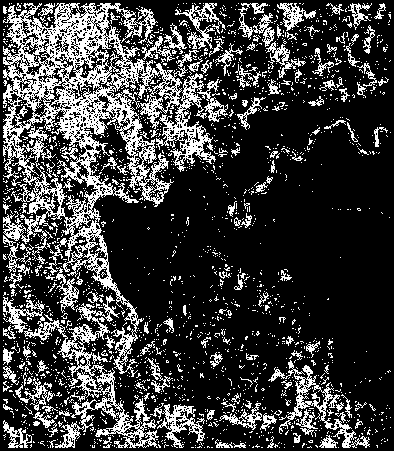


Segunda Banda



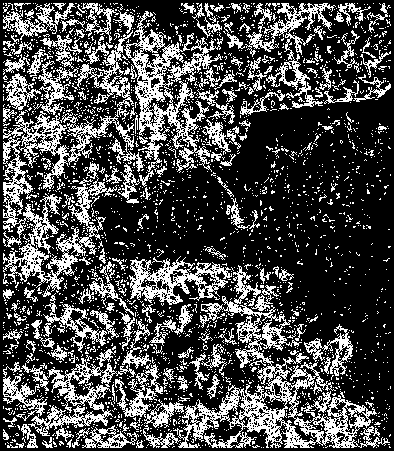


Tercera Banda



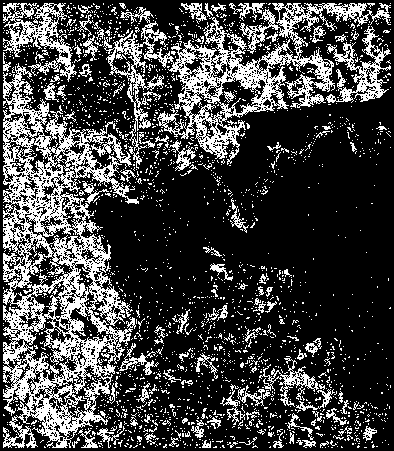

In [ ]:
# Cargamos la imagen satelital
image = cv2.imread(path+'LC08_224-078_2018-01-05_RGB.tif')[:,324:718]

# Aplicamos el detector de esquinas SUSAN a cada banda por separado
corners_b = susan_detection(image[:, :, 0], threshold=10, upper_limit=0.85, lower_limit=0.65)
corners_g = susan_detection(image[:, :, 1], threshold=10, upper_limit=0.85, lower_limit=0.65)
corners_r = susan_detection(image[:, :, 2], threshold=10, upper_limit=0.85, lower_limit=0.65)

print('\nPrimera Banda\n')
cv2_imshow(corners_b)
print('\nSegunda Banda\n')
cv2_imshow(corners_g)
print('\nTercera Banda\n')
cv2_imshow(corners_r)

# 5. Utilizar el método SIFT para reconocimiento de objetos en una imagen. La idea de este ejercicio es reconocer si dos imágenes son, en realidad, la misma. Esto puede realizarse contando los descriptores de cada una y las coincidencias entre los descriptores. Aplicar el método a diferentes pares de imégenes, observando el comportamiento bajo rotación, traslación, cambios en la iluminación, cambios de escala y movimiento de perspectiva.

In [ ]:
# Armamos una función que haga todo el proceso para que sea más sencillo aplicarlo a varios pares de imágenes

def sift(imagen1, imagen2, X=50):
  # Cargamos las imágenes
  img1 = cv2.imread(path+imagen1)
  img2 = cv2.imread(path+imagen2)

  # Las pasamos a escala de grises, como necesita SIFT
  img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
  img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

  # Creamos un objeto SIFT
  sift = cv2.xfeatures2d.SIFT_create()

  # Detectamos las features de SIFT en ambas imágenes
  keypoints_1, descriptors_1 = sift.detectAndCompute(img1, None) # Esta función permite pasarle una máscara como región de interés para buscar descriptores. Al pasarle None como argumento, se considera que no hay restricciones en la detección ni en el cálculo de los descriptores, y se procesa la imagen completa.
  keypoints_2, descriptors_2 = sift.detectAndCompute(img2, None)

  # Creamos el matcher de features
  bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)
  # El objeto cv2.BFMatcher se utiliza para realizar la coincidencia entre descriptores de características en un enfoque de fuerza bruta. Este enfoque compara todos los descriptores de un conjunto con todos los descriptores del otro conjunto.
  # cv2.NORM_L1: especifica la medida de distancia que se utilizará para comparar los descriptores. En este caso, se utiliza la distancia L1 (sumando las diferencias absolutas entre las coordenadas de los descriptores).
  # crossCheck especifica si se debe realizar una verificación cruzada en las coincidencias. Cuando es True, el algoritmo comprueba si las correspondencias son mutuas. Es decir, una coincidencia de A a B solo se considera válida si también hay una coincidencia de B a A. Esto ayuda a filtrar coincidencias incorrectas.

  # Ahora matcheamos
  matches = bf.match(descriptors_1, descriptors_2)

  # Ordenamos según la distancia de los matches
  matches = sorted(matches, key = lambda x:x.distance)
  # Para dibujar y que no quede muy desprolijo, nos quedamos solo con los X matches con menor distancia
  matched_img = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, matches[:X], img2, flags=2)

  # Vemos cuántos descriptores tenemos en cada imagen, y cuántos de estos matchean
  print(f'\nCantidad de descriptores en la imagen 1: {len(descriptors_1)}')
  print(f'Cantidad de descriptores en la imagen 2: {len(descriptors_2)}')
  print(f'Cantidad de coincidencias: {len(matches)}')

  # Tomamos el porcentaje de matcheo como la proporción entre la cantidad de coincidencias sobre la cantidad de descriptores de la imagen que menos tenga.
  # Esto es solo una idea que tomamos. También podriamos tomar la cantidad de matches sobre la cantidad máxima de descriptores, o sobre un promedio de la cantidad de descriptores de ambas imágenes. O varias otras opciones.
  porcentaje_matcheo = 100*len(matches)/min(len(descriptors_1),len(descriptors_2))
  print(f'\nPorcentaje de matcheo: {porcentaje_matcheo:.1f}%\n')

  # Mostramos los matches
  cv2_imshow(matched_img)


Cantidad de descriptores en la imagen 1: 630
Cantidad de descriptores en la imagen 2: 1494
Cantidad de coincidencias: 406

Porcentaje de matcheo: 64.4%



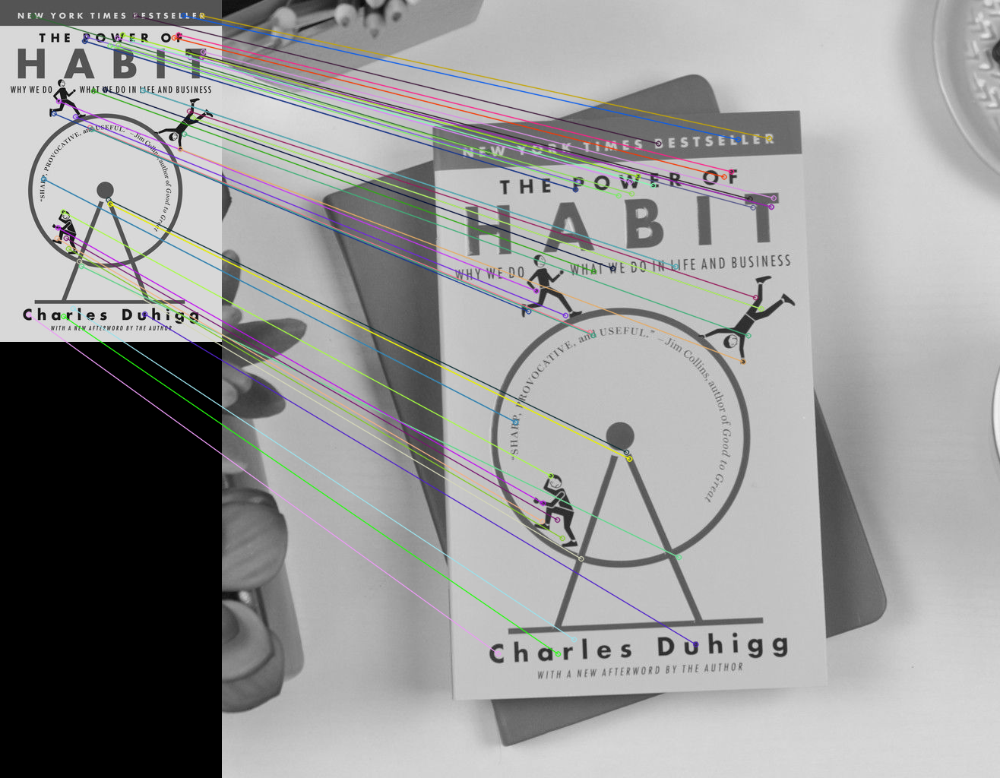

In [ ]:
# Aplicamos la función a dos imágenes que contienen el mismo libro.
sift('libro1.jpg', 'libro2.jpg')

# Vemos un porcentaje de matcheo relativamente alto, de más del 60%.
# Y además vemos que los descriptores se matchean bastante bien entre ambas imágenes.


Cantidad de descriptores en la imagen 1: 948
Cantidad de descriptores en la imagen 2: 630
Cantidad de coincidencias: 148

Porcentaje de matcheo: 23.5%



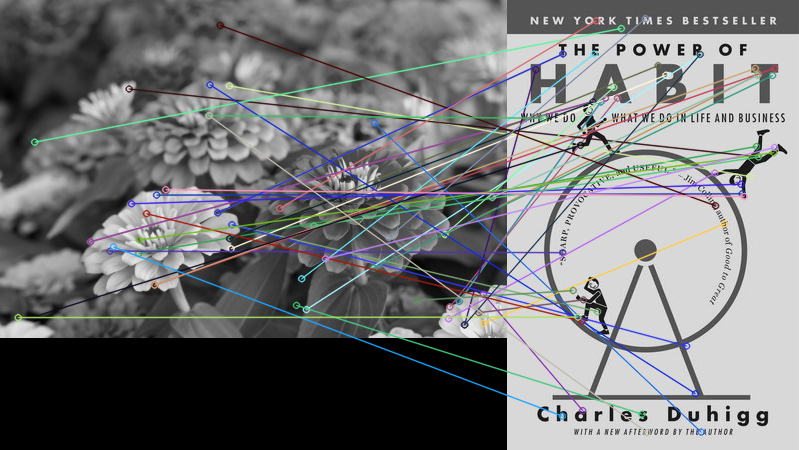

In [ ]:
# Solo como prueba, probamos el método con dos imágenes bien distintas entre sí.
sift('flores.jpg', 'libro1.jpg')

# Como es de esperar, el porcentaje de matcheo bajó mucho, a un 23.5%.
# Sin embargo siguen apareciendo muchas coincidencias que en realidad son erroneas.


Cantidad de descriptores en la imagen 1: 5141
Cantidad de descriptores en la imagen 2: 26594
Cantidad de coincidencias: 1703

Porcentaje de matcheo: 33.1%



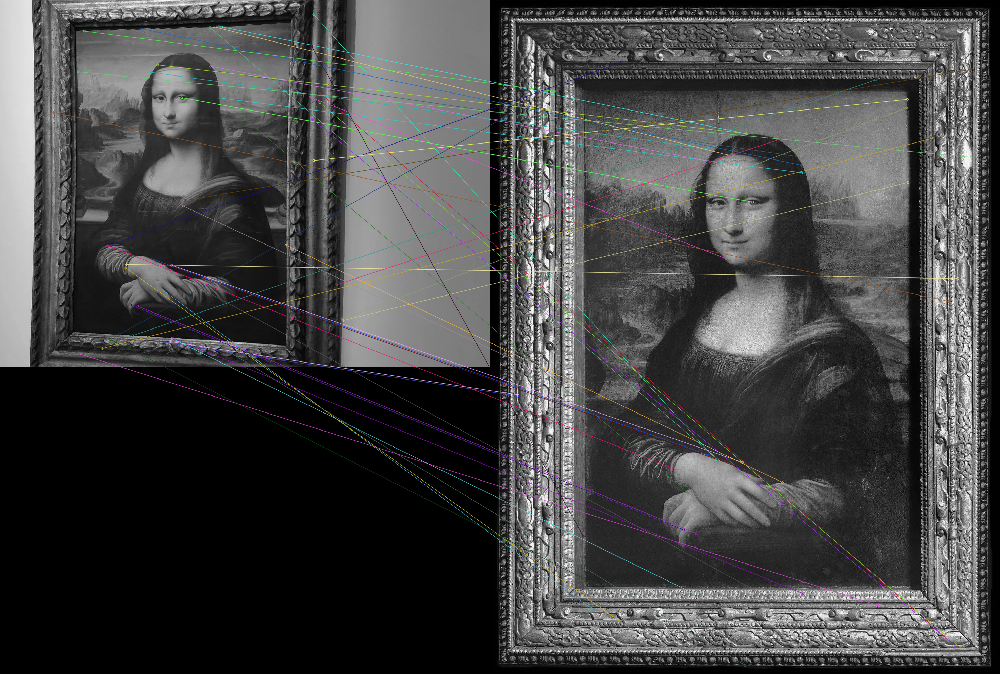

In [ ]:
# Ahora vemos que pasa con dos imágenes que tienen un (pequeño) cambio de perspectiva.
sift('mona_lisa1.jpg', 'mona_lisa2.jpg')

# En este caso el porcentaje es un poco mejor que el caso de dos imágenes totalmente diferentes, pero sigue siendo bajo.
# De hecho se ve que las coincidencias y los descriptores se centran mucho en el marco más que en la pintura en sí.


Cantidad de descriptores en la imagen 1: 174
Cantidad de descriptores en la imagen 2: 509
Cantidad de coincidencias: 69

Porcentaje de matcheo: 39.7%



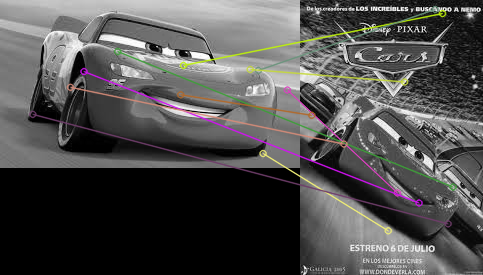

In [ ]:
# Ahora vemos el caso de una rotación
sift('cars1.jfif', 'cars2.jfif', X=10) # Ponermos X=10 para que grafique solamente los primeros 10 match, y que se vea mejor

# El porcentaje es casi 40%. El matcheo de algunas características se puede ver que es correcto, pero hay varios que se ve que no están bien.


Cantidad de descriptores en la imagen 1: 839
Cantidad de descriptores en la imagen 2: 869
Cantidad de coincidencias: 296

Porcentaje de matcheo: 35.3%



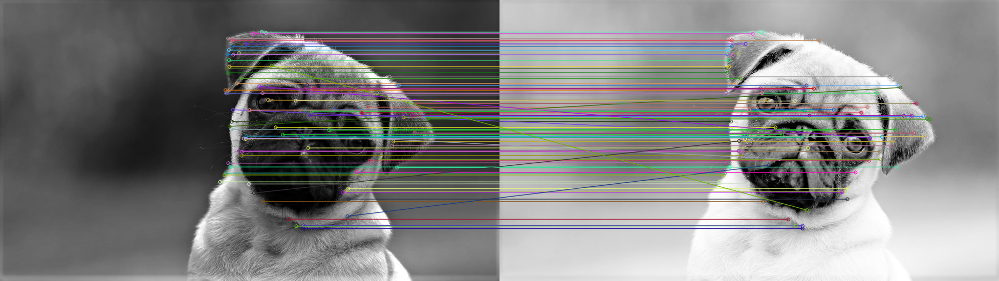

In [ ]:
# Ahora vemos que pasa con dos imágenes iguales pero con distinta iluminación, una bien clara y la otra bien oscura.
sift('perro1.jpg', 'perro2.jpg', X=100)

# Como se ve en la imagen, los primeros descriptores están matcheados muy bien.
# Pero si miramos más descriptores, empieza a fallar.
# Es por esto que el porcentaje no da tan alto, solo 35.3%.


Cantidad de descriptores en la imagen 1: 108
Cantidad de descriptores en la imagen 2: 178
Cantidad de coincidencias: 40

Porcentaje de matcheo: 37.0%



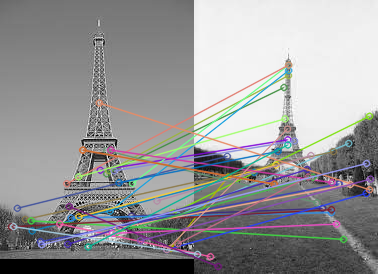

In [ ]:
# Ahora vemos que pasa con un cambio de escala.
sift('eiffel1.jfif', 'eiffel2.jfif')

# El resultado no es el mejor, se confunde mucho con el fondo.
# Para la imagen en donde la torre eiffel está más chicas, le presta mucha menos atención y se centra más en el fondo.


Cantidad de descriptores en la imagen 1: 153
Cantidad de descriptores en la imagen 2: 142
Cantidad de coincidencias: 43

Porcentaje de matcheo: 30.3%



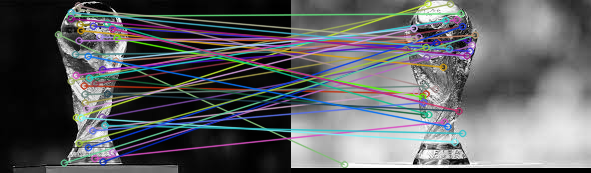

In [ ]:
# Para terminar vemos un ejemplo de una traslación.
sift('copa1.jfif', 'copa2.jfif')

# Es bueno para matchear partes de la copa, con otras partes de la copa, pero se confunde y no matchea exactamente lo que corresponde.
# También es cierto que es facil confundirse entre partes de la copa porque no tiene distinciones muy claras.

# 6. Clasificar una imagen satelital utilizando métodos de clasificación no supervisada. Aplicar el método de K-medias y el método de Kohonen mostrar los resultados de la clasificación y la matriz U.

## K-medias

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Text(0.5, 1.0, '\nImagen clasificada en 3 clusters')

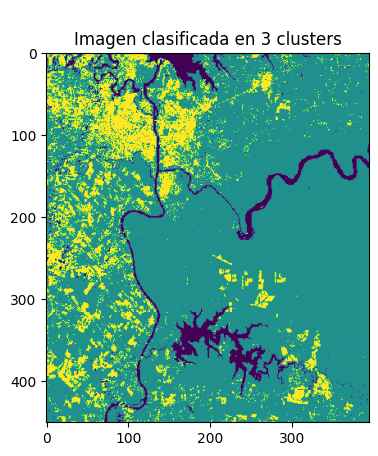

In [ ]:
# Cargamos la imagen satelital
imagen = cv2.imread(path+'LC08_224-078_2018-01-05_RGB.tif')[:,324:718]
imagen = np.array(imagen)

# Obtenemos las dimensiones de la imagen
alto, ancho, bandas = imagen.shape

# Preparamos los datos
datos = imagen.reshape(alto * ancho, bandas)
datos_normalizados = datos.astype(float) / 255.0

# Método de K-medias
k = 3 # Número de clases
kmedias = KMeans(n_clusters=k, random_state=0)
kmedias.fit(datos_normalizados)

# Obtenemos la clasificación y los centroides
clasificacion = kmedias.labels_
centroides = kmedias.cluster_centers_

# Mostramos resultados de la clasificación
imagen_clasificada = np.reshape(clasificacion, (alto, ancho))
plt.imshow(imagen_clasificada)
plt.title(f'\nImagen clasificada en {k} clusters')

In [ ]:
# Calculamos la siguiente matriz para K-Medias:
# Cada fila es un pixel
# Cada columna es la distancia (en el espacio RGB) del pixel a cada uno de los centroides
# Fila 0, columna 0: Distancia en el espacio RGB del primer pixel al primer centroide
# Fila 0, columna 1: Distancia en el espacio RGB del primer pixel al segundo centroide
# Etc.
# El pixel pertenecerá al cluster del centroide al que se encuentra más cercano
matriz_U = kmedias.transform(datos_normalizados)
matriz_U # Muestra la proporción de pertenencia de cada pixel (cada fila) a cada una de las clases (cada columna)

array([[0.84618656, 0.07246195, 0.66344154],
       [0.86423742, 0.0698979 , 0.67120745],
       [0.65830297, 0.39734033, 0.40257168],
       ...,
       [0.70688778, 0.17259219, 0.80866387],
       [0.68975271, 0.17187327, 0.64268576],
       [0.63671657, 0.19940774, 0.7234283 ]])

## Kohonen

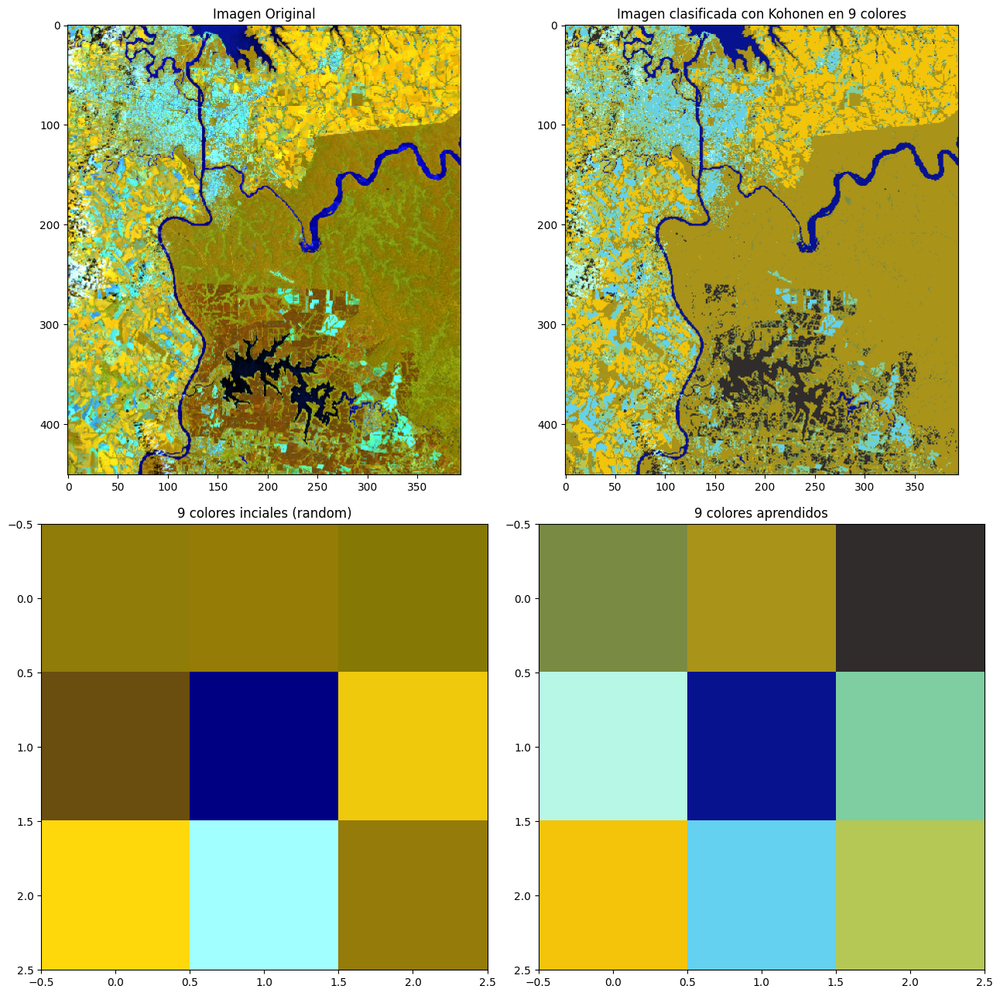

In [ ]:
# Cargamos la imagen
imagen = Image.open(path+'LC08_224-078_2018-01-05_RGB.tif')
imagen = np.array(imagen)[:,324:718]

# Formateamos la imagen para que tenga el formato que la libreria de MiniSom necesita
alto, ancho, bandas = imagen.shape
datos = imagen.reshape(alto * ancho, bandas) # Una fila es un pixel, y cada columna es el valor del pixel en cada banda
datos_normalizados = datos.astype(float) / 255.0

# Inicializamos SOM (que aplica el método de Kohonen)
# Un SOM de 3x3 implica que se va a clasificar a la imagen en q1xq2 = 3x3 = 9 colores
q1 = 3 # Cantidad de neuronas en una dirección de la red de Kohonen
q2 = 3 # Cantidad de neuronas en la otra dirección de la red de Kohonen
som = MiniSom(q1, q2, bandas, sigma=0.3, learning_rate=0.5) # El sigma controla el alcance o el tamaño del vecindario durante el entrenamiento

# Empezamos con colores random tomados de la imagen (colores, o clases, iniciales, antes de entrenar)
som.random_weights_init(datos_normalizados)
starting_weights = som.get_weights().copy() # Guardamos los pesos iniciales para visualizarlos después

# Entrenamos al algoritmo
cantidad_de_iteraciones = 500*bandas # Como cantidad de iteraciones tomamos 500 por la cantidad de neuronas de entrada (que son la cantidad de bandas)
som.train(datos_normalizados, cantidad_de_iteraciones, random_order=True) # random_order=True hace que los datos se presenten al mapa SOM en un orden aleatorio en cada iteración del entrenamiento

# Cuantizamos cada pixel de la imagen
# Es decir que nos quedamos, para cada pixel, con la clase (o color) que mejor lo representa
qnt = som.quantization(datos_normalizados)
clustered = np.zeros(imagen.shape)
for i, q in enumerate(qnt): # Ponemos los valores cuantizados en una nueva imagen
    clustered[np.unravel_index(i, shape=(imagen.shape[0], imagen.shape[1]))] = q

# Mostramos los resultados
plt.figure(figsize=(13, 13))
plt.figure(1)
plt.subplot(221)
plt.title('Imagen Original')
plt.imshow(imagen)
plt.subplot(222)
plt.title(f'Imagen clasificada con Kohonen en {q1*q2} colores')
plt.imshow(clustered)

plt.subplot(223)
plt.title(f'{q1*q2} colores inciales (random)')
plt.imshow(starting_weights, interpolation='none')
plt.subplot(224)
plt.title(f'{q1*q2} colores aprendidos')
plt.imshow(som.get_weights(), interpolation='none')

plt.tight_layout()

In [ ]:
# Matriz U:
# Cada valor de la matriz representa la distancia promedio entre la neurona en esa posición y sus vecinas dentro de la red de Kohonen.

layout = go.Layout(title='Matriz U')
fig = go.Figure(layout=layout)
fig.add_trace(go.Heatmap(z=som.distance_map().T, colorscale='Purples')) # som.distance_map() calcula directamente la matriz U
fig.update_layout(width=500, height=400)
fig.show()

In [ ]:
# Otra forma para visualizar la calidad de agrupamiento de cada neurona:
# Este mapa utiliza colores para mostrar la diferencia promedio entre los valores (píxeles) correspondientes a una neurona y los pesos de la neurona
# Es decir que muestra que tan similar es la neurona a los píxeles que representa
# Las neuronas que no son la neurona ganadora para ningun pixel se dejan en blanco

win_map = som.win_map(datos_normalizados) # Contiene las muestras (píxeles) agrupadas según la neurona ganadora correspondiente
qualities = np.empty((q1,q2))
qualities[:] = np.NaN # Tenemos una matriz del tamaño de la red de Kohonen con todos NaN's. Quieremos empezar con todos NaN's porque si hay neuronas que NO son las ganadoras para ningun pixel, entonces quiero que queden en NaN.
# Calculamos la diferencia media de las diferencias entre los pesos de las neuronas y los valores de los píxeles correspondientes
for position, values in win_map.items():
    qualities[position[0], position[1]] = np.mean(abs(values-som.get_weights()[position[0], position[1]]))

# Visualizamos la matriz
layout = go.Layout(title='Distancia promedio entre el peso de cada neurona<br>y los píxeles a los cuales representa')
fig = go.Figure(layout=layout)
fig.add_trace(go.Heatmap(z=qualities, colorscale='Purples'))
fig.update_layout(width=500, height=400)

# Una neurona "buena" es la que aparece con un valor bajo en la matriz
# Esto es porque significa que en promedio tiene un valor similar al de todos los píxeles que corresponden a ella
# En un muy buen clasificador esperamos que todas o casi todas las neuronas tengan un valor bajo en este gráfico

In [ ]:
# Ahora calculamos la matriz que indica cuantos píxeles son asignados a cada neurona

# Inicializamos la matriz con ceros
U = np.zeros((q1, q2))

# Calculamos la matriz
for i in range(datos_normalizados.shape[0]): # Loopeamos por todos los píxeles
    x = datos_normalizados[i]
    winning_neuron = som.winner(x) # Para cada pixel, vemos cuál es la neurona ganadora
    U[winning_neuron[0], winning_neuron[1]] += 1 # Le sumamos un uno a la neurona ganadora

layout = go.Layout(title='Cantidad de píxeles asignados a cada neurona')
fig = go.Figure(layout=layout)
fig.add_trace(go.Heatmap(z=U, colorscale='Purples'))
fig.update_layout(width=500, height=400)
fig.show()

In [ ]:
# Repetimos el proceso de aplicar el método de Kohonen y calcular la matriz U pero con otra imagen.
# Solo para ver cómo queda y cómo se ve cuando usamos muchas más neuronas.

/usr/local/lib/python3.10/dist-packages/minisom.py:536: RuntimeWarning:

invalid value encountered in sqrt



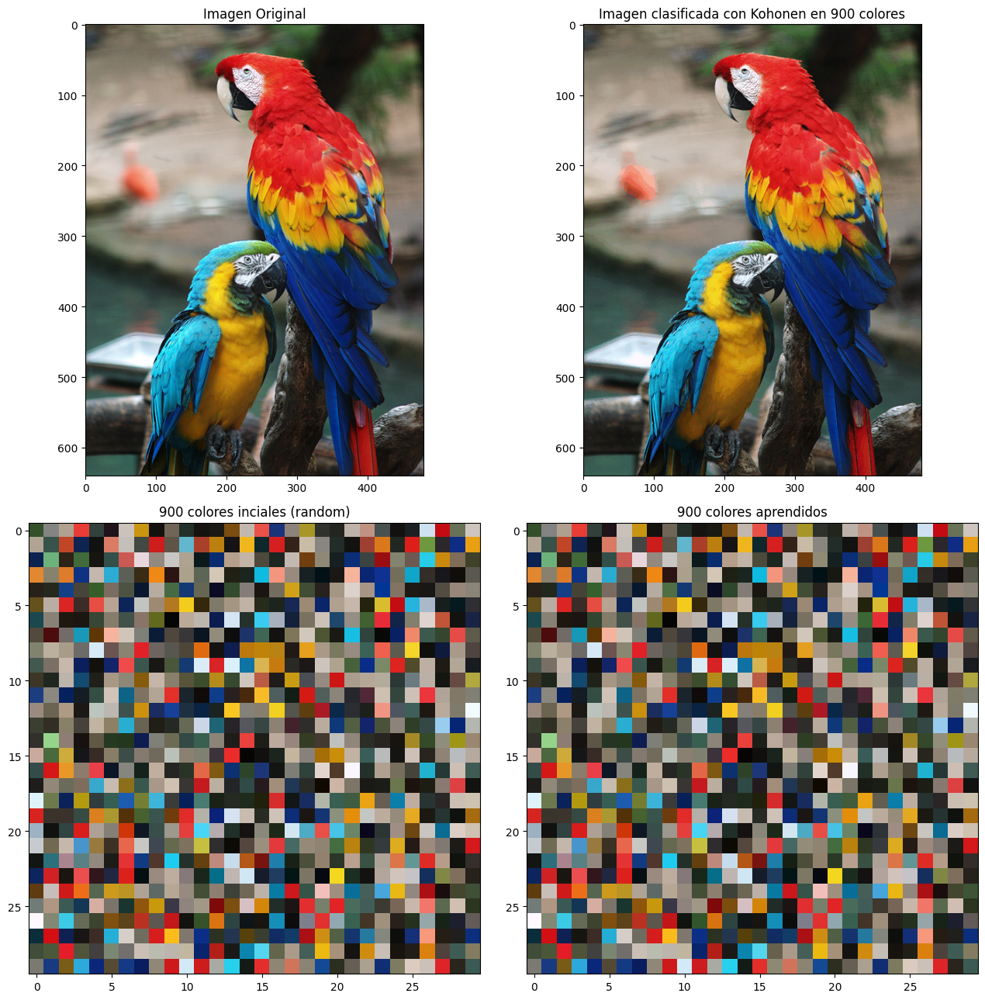

In [ ]:
# Cargamos la imagen
imagen = Image.open(path+'loros.jpg')
imagen = np.array(imagen)

# Formateamos la imagen para que tenga el formato que la libreria de MiniSom necesita
alto, ancho, bandas = imagen.shape
datos = imagen.reshape(alto * ancho, bandas) # Una fila es un pixel, y cada columna es el valor del pixel en cada banda
datos_normalizados = datos.astype(float) / 255.0

# Inicializamos SOM (que aplica el método de Kohonen)
# Un SOM de 3x3 implica que se va a clasificar a la imagen en q1xq2 = 3x3 = 9 colores
q1 = 30 # Cantidad de neuronas en una dirección de la red de Kohonen
q2 = 30 # Cantidad de neuronas en la otra dirección de la red de Kohonen
som = MiniSom(q1, q2, bandas, sigma=0.3, learning_rate=0.5) # El sigma controla el alcance o el tamaño del vecindario durante el entrenamiento

# Empezamos con colores random tomados de la imagen (colores, o clases, iniciales, antes de entrenar)
som.random_weights_init(datos_normalizados)
starting_weights = som.get_weights().copy() # Guardamos los pesos iniciales para visualizarlos después

# Entrenamos al algoritmo
cantidad_de_iteraciones = 500*bandas # Como cantidad de iteraciones tomamos 500 por la cantidad de neuronas de entrada (que son la cantidad de bandas)
som.train(datos_normalizados, cantidad_de_iteraciones, random_order=True) # random_order=True hace que los datos se presenten al mapa SOM en un orden aleatorio en cada iteración del entrenamiento

# Cuantizamos cada pixel de la imagen
# Es decir que nos quedamos, para cada pixel, con la clase (o color) que mejor lo representa
qnt = som.quantization(datos_normalizados)
clustered = np.zeros(imagen.shape)
for i, q in enumerate(qnt): # Ponemos los valores cuantizados en una nueva imagen
    clustered[np.unravel_index(i, shape=(imagen.shape[0], imagen.shape[1]))] = q

# Mostramos los resultados
plt.figure(figsize=(13, 13))
plt.figure(1)
plt.subplot(221)
plt.title('Imagen Original')
plt.imshow(imagen)
plt.subplot(222)
plt.title(f'Imagen clasificada con Kohonen en {q1*q2} colores')
plt.imshow(clustered)

plt.subplot(223)
plt.title(f'{q1*q2} colores inciales (random)')
plt.imshow(starting_weights, interpolation='none')
plt.subplot(224)
plt.title(f'{q1*q2} colores aprendidos')
plt.imshow(som.get_weights(), interpolation='none')

plt.tight_layout()

In [ ]:
# Matriz U:
# Cada valor de la matriz representa la distancia promedio entre la neurona en esa posición y sus vecinas dentro de la red de Kohonen.

layout = go.Layout(title='Matriz U')
fig = go.Figure(layout=layout)
fig.add_trace(go.Heatmap(z=som.distance_map().T, colorscale='Purples')) # som.distance_map() calcula directamente la matriz U
fig.update_layout(width=500, height=400)